In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import re
import math
import matplotlib.gridspec as gridspec
import seaborn as sns; sns.set()
import numpy as np
run_id = "all_reads_nanopolish_0.14_p-bad_p-skip_0_smash_seq_analysis" 
server = f'/run/user/1000/gvfs/smb-share:server=132.66.152.167,share=ebenstein%202022'
run_id_path = f'{server}/5hmC_ONT_project_data_and_analysis/220922_5hmC_trainingh/analysis30.05.23/' #/{run_id}/analysis30.05.23/
plot_path = run_id_path + 'events & NNN plots'
if not os.path.exists(plot_path):
    os.mkdir(plot_path)
print(f"Directory {plot_path} created")
backwindow=18
frontwindow=10
full_dict = {"09": {"i": 0, "color": 'b', "name": "Cytosine", "Modification": "C"},
         "10": {"i": 1, "color": 'orange', "name": "5hmC", "Modification": "hmC"},
         "11": {"i": 2, "color": 'g', "name": "5gmc", "Modification": "Glu-hmC"},
         "12": {"i": 3, "color": 'r', "name": "5gmc-N3", "Modification": "N3-Glu-hmC"},
         "13": {"i": 4, "color": 'y', "name": "5mc", "Modification": "5mC"}}
barcodes = ['09','10','11','12', '13']
barcode_dict = {key: full_dict[key] for key in full_dict if key in barcodes}

back=7
front=3
total_pos = back+front+1

locs = pd.read_csv('/home/nano/Documents/nanopore_piplines/timps_data/test_pipline/barcode01/CTGGGCGAGGT_chr1-6_with_fill_mC.bedgraph', 
                   header=None, sep="\t")
locs.columns = ['NC','c','g','seq']
locs['loc_files'] = (locs['c']-backwindow).map(str)+"_"+(locs['c']+frontwindow).map(str)
modifications = locs['c'].to_numpy()
loc_files = list(locs['loc_files'].to_numpy())
loc_files.remove('65597530_65597558')
loc_files.remove('124990840_124990868')
loc_files = loc_files
import matplotlib
print(f'matplotlib {matplotlib. __version__}')
print(f'seaborn {sns. __version__}')
print(loc_files)

Directory /run/user/1000/gvfs/smb-share:server=132.66.152.167,share=ebenstein%202022/5hmC_ONT_project_data_and_analysis/220922_5hmC_trainingh/analysis30.05.23/events & NNN plots created
matplotlib 3.7.1
seaborn 0.12.2
['35012780_35012808', '90093194_90093222', '90093195_90093223', '100841407_100841435', '118194794_118194822', '119451384_119451412', '130111245_130111273', '130111246_130111274', '133001642_133001670', '165261090_165261118', '168447069_168447097', '185710054_185710082', '195060987_195061015', '5061569_5061597', '5061570_5061598', '7665112_7665140', '7665113_7665141', '24937314_24937342', '39428218_39428246', '39773361_39773389', '55794829_55794857', '68897991_68898019', '126637179_126637207', '129858291_129858319', '146044960_146044988', '177102471_177102499', '177102472_177102500', '16399098_16399126', '16399099_16399127', '35902783_35902811', '37150387_37150415', '37150388_37150416', '41898025_41898053', '49302722_49302750', '55551524_55551552', '63376359_63376387', '70

In [3]:
total_df = pd.DataFrame()
appended_data = []
bc_df={}
grouped={}
for seq_location in loc_files:
    start_loc = int(seq_location.split('_')[0])
    mod_loc = start_loc + backwindow 
    for bc in ["13"]:#full_dict.keys():
        print(seq_location)
        bc_df[bc]=pd.read_csv(r'/home/nano/Documents/nanopore_piplines/220299_5hmc_training/' + run_id +"/101217_3303900//aligned_reads_barcode" + bc + "_101217_3303900_forward/"
                         + seq_location + ".eventalign.tsv", header=None, sep="\t")#.head(1000) # TO_REMOVE head!!!

        bc_df[bc] = bc_df[bc][(bc_df[bc][1] >= mod_loc - back) & (bc_df[bc][1] <= mod_loc + front)]
        bc_df[bc][["ones"]]=1
        bc_df[bc].to_pickle(f'{run_id_path}/bc_{bc}_{mod_loc}_mod_pos_eventalign.pkl')
#     grouped09=bc_df['09'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#     grouped10=bc_df['10'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#     grouped11=bc_df['11'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#     grouped12=bc_df['12'].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#         grouped['13']=bc_df[bc].groupby([1,3]).agg({8:'sum', "ones":'sum',6:'mean'})
#         grouped['13']= grouped['13'].reset_index()
# #     grouped09= grouped09.reset_index()
# #     grouped10= grouped10.reset_index()
# #     grouped11= grouped11.reset_index()
# #     grouped12= grouped12.reset_index()
#     mapped09=grouped09.groupby([1]).agg({8:'mean', "ones":'mean',6:'mean'})
#     for index, row in grouped09.iterrows():
#         grouped09.at[index,"current diff"]=(grouped09.loc[index,6])-(mapped09.loc[(grouped09.iloc[index,0]),6])
#         grouped09.at[index,"dwell diff"]=(grouped09.loc[index,8])-(mapped09.loc[(grouped09.iloc[index,0]),8])
#     for index, row in grouped10.iterrows():
#         grouped10.at[index,"current diff"]=(grouped10.loc[index,6])-(mapped09.loc[(grouped10.iloc[index,0]),6])
#         grouped10.at[index,"dwell diff"]=(grouped10.loc[index,8])-(mapped09.loc[(grouped10.iloc[index,0]),8])
#     for index, row in grouped11.iterrows():
#         grouped11.at[index,"current diff"]=(grouped11.loc[index,6])-(mapped09.loc[(grouped11.iloc[index,0]),6])
#         grouped11.at[index,"dwell diff"]=(grouped11.loc[index,8])-(mapped09.loc[(grouped11.iloc[index,0]),8])
#     for index, row in grouped12.iterrows():
#         grouped12.at[index,"current diff"]=(grouped12.loc[index,6])-(mapped09.loc[(grouped12.iloc[index,0]),6])
#         grouped12.at[index,"dwell diff"]=(grouped12.loc[index,8])-(mapped09.loc[(grouped12.iloc[index,0]),8])
#     grouped09["Modification"]="C"
#     grouped10["Modification"]="hmC"
#     grouped11["Modification"]="Glu-hmC"
#     grouped12["Modification"]="N3-Glu-hmC"
#     df = pd.concat([grouped09, grouped10, grouped11, grouped12])
#     df['seq_location'] = seq_location
#     appended_data.append(df)

# total_df = pd.concat(appended_data)
# total_df.to_pickle(f'{run_id_path}/pos_read_grouped_C_norm_current_dwell_df.pkl')
# total_df['seq_location'].unique()

35012780_35012808
90093194_90093222
90093195_90093223
100841407_100841435
118194794_118194822
119451384_119451412
130111245_130111273
130111246_130111274
133001642_133001670
165261090_165261118
168447069_168447097
185710054_185710082
195060987_195061015
5061569_5061597
5061570_5061598
7665112_7665140
7665113_7665141
24937314_24937342
39428218_39428246
39773361_39773389
55794829_55794857
68897991_68898019
126637179_126637207
129858291_129858319
146044960_146044988
177102471_177102499
177102472_177102500
16399098_16399126
16399099_16399127
35902783_35902811
37150387_37150415
37150388_37150416
41898025_41898053
49302722_49302750
55551524_55551552
63376359_63376387
70077099_70077127
88561663_88561691
116766911_116766939
116766912_116766940
131071503_131071531
153363833_153363861
153363834_153363862
158639053_158639081
158639054_158639082
5248731_5248759
8976370_8976398
12718947_12718975
12718948_12718976
19835461_19835489
25588931_25588959
32935775_32935803
68214233_68214261
68214234_68214

In [544]:
loc_files
total_pos = back+front+1

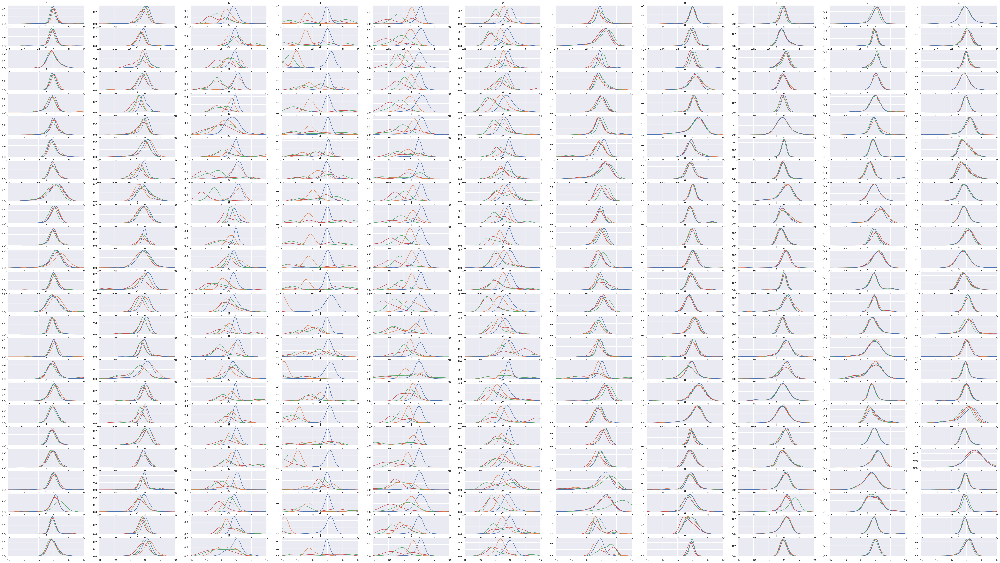

In [28]:
total_df = pd.read_pickle(f'{run_id_path}/pos_read_grouped_C_norm_current_dwell_df.pkl')
fig, axes = plt.subplots(len(loc_files), total_pos, figsize=(71.2,40))
j=0
for seq_location in loc_files:
    df = total_df[total_df['seq_location']==seq_location]
    positions=df[1].unique()
    i=0
    for key in positions:
         pos=i-back
         ax=sns.kdeplot(data=df.loc[df[1]==key], x='current diff',hue="Modification", ax=axes[j,i], legend=False, common_norm=False)
         ax.set(xlabel=None)
         ax.set_title(pos)
         ax.set(ylabel=None)
         ax.set_xlim(-15,10)
         i+=1
    j+=1
plt.plot()
plt.savefig(f'{run_id_path}/events & NNN plots/1total_curr_diff_all_pos.png')

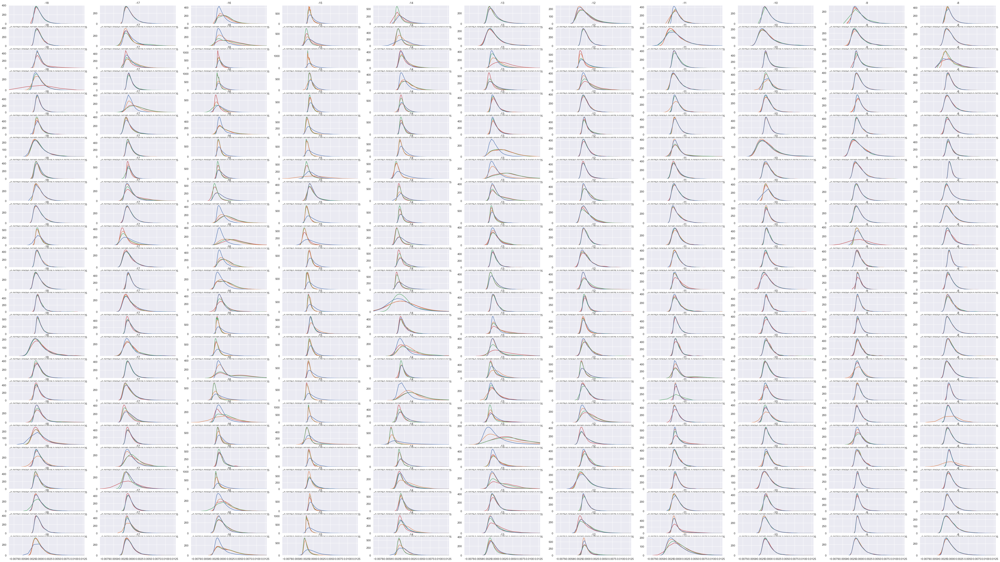

In [546]:
fig, axes = plt.subplots(len(loc_files), total_pos, figsize=(71.2,40))
j=0
for seq_location in loc_files:
    df = total_df[total_df['seq_location']==seq_location]
    positions=df[1].unique()
    i=0
    for key in positions:
        pos=i-back
        ax=sns.kdeplot(data=df.loc[df[1]==key], x='dwell diff',hue="Modification", ax=axes[j,i], legend=False, common_norm=False)
        ax.set(xlabel=None)
        ax.set_title(pos)
        ax.set(ylabel=None)
        ax.set_xlim(-0.009,0.013)
        i+=1
    j+=1
plt.plot()
plt.savefig(f'{run_id_path}/events & NNN plots/1total_dwell diff_all_pos2.png')

In [42]:
# https://stackoverflow.com/questions/35042255/how-to-plot-multiple-seaborn-jointplot-in-subplot

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import numpy as np


class SeabornFig2Grid():

    def __init__(self, seaborngrid, fig,  subplot_spec):
        self.fig = fig
        self.sg = seaborngrid
        self.subplot = subplot_spec
        if (isinstance(self.sg, sns.axisgrid.FacetGrid) or isinstance(self.sg, sns.axisgrid.PairGrid)):
            self._movegrid()
        elif isinstance(self.sg, sns.axisgrid.JointGrid):
            self._movejointgrid()
        self._finalize()

    def _movegrid(self):
        """ Move PairGrid or Facetgrid """
        self._resize()
        n = self.sg.axes.shape[0]
        m = self.sg.axes.shape[1]
        self.subgrid = gridspec.GridSpecFromSubplotSpec(
            n, m, subplot_spec=self.subplot)
        for i in range(n):
            for j in range(m):
                self._moveaxes(self.sg.axes[i, j], self.subgrid[i, j])

    def _movejointgrid(self):
        """ Move Jointgrid """
        h = self.sg.ax_joint.get_position().height
        h2 = self.sg.ax_marg_x.get_position().height
        r = int(np.round(h / h2))
        self._resize()
        self.subgrid = (gridspec.GridSpecFromSubplotSpec(r + 1, r + 1,
                        subplot_spec=self.subplot))

        self._moveaxes(self.sg.ax_joint, self.subgrid[1:, :-1])
        self._moveaxes(self.sg.ax_marg_x, self.subgrid[0, :-1])
        self._moveaxes(self.sg.ax_marg_y, self.subgrid[1:, -1])

    def _moveaxes(self, ax, gs):
        # https://stackoverflow.com/a/46906599/4124317
        ax.remove()
        ax.figure = self.fig
        self.fig.axes.append(ax)
        self.fig.add_axes(ax)
        ax._subplotspec = gs
        ax.set_position(gs.get_position(self.fig))
        ax.set_subplotspec(gs)

    def _finalize(self):
        plt.close(self.sg.fig)
        self.fig.canvas.mpl_connect("resize_event", self._resize)
        self.fig.canvas.draw()

    def _resize(self, evt=None):
        self.sg.fig.set_size_inches(self.fig.get_size_inches())

In [4]:
for seq_location in loc_files:
    df = total_df[total_df['seq_location']==seq_location]
    positions=df[1].unique()
    fig = plt.figure(figsize=(32,6))
    gs = gridspec.GridSpec(1, 8)
    i=0
    for key in positions[back-7:back+1]:
        plot = sns.jointplot(data=df.loc[df[1]==key], x='current diff', y='dwell diff', hue="Modification", alpha=0.3, s=5, linewidths=None, legend=False, marginal_kws={'common_norm':False})
        plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
        plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
        plot.ax_joint.set_xlabel(f'{i-7}', fontweight='bold', fontsize=13)
        plot.ax_joint.set_ylabel(None)
        plot.ax_joint.set_xlim(-15,10)
        plot.ax_joint.set_ylim(-0.005,0.02)
        #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
       # plot.tick_params(axis='both', which='major', labelsize=8)
        mgkey = SeabornFig2Grid(plot, fig, gs[i])
        i+=1
    #gs = gs.annotate(stats.pearsonr, fontsize=10)
    fig.text(0.5, 0.02, 'current diff', ha='center', va='center', fontweight='bold', fontsize=20)
    fig.text(0.04, 0.5, 'dwell diff', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=20)
    gs.tight_layout(fig)
    plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_by_pos.png')

NameError: name 'total_df' is not defined

In [4]:
print(loc_files)
i=0
fig = plt.figure(figsize=(71.2,40))
gs = gridspec.GridSpec(5, 5)
hole_window_agg = {}

for seq_location in loc_files:
    mod_loc = int(seq_location.split('_')[0])+backwindow+1
    hole_window_agg[seq_location] = {}

    bc_df = {}
    for bc in ['13']:#full_dict.keys():
        bc_df[bc] = pd.read_pickle(f'{run_id_path}/bc_{bc}_{mod_loc}_mod_pos_eventalign.pkl')

    
    for bc in ['13']:# full_dict.keys():
    ### Jonathans window agg suggestion! -8 to +3 known pos to known pos
        hole_window_agg[seq_location][bc] = bc_df[bc].groupby([3]).agg({6: 'mean', 8: 'sum', 13: lambda x: ','.join(x)})
        hole_window_agg[seq_location][bc][13] = [list(map(float, i)) for i in hole_window_agg[seq_location][bc][13].str.split(",")]

        # drow functions the vectors on scatter!!!!
        hole_window_agg[seq_location][bc]['samples_count'] = hole_window_agg[seq_location][bc][13].str.len()

        # hole_window_agg[seq_location][bc][13] = hole_window_agg[seq_location][bc][13].str.split(",")
        # drow the vectors on scatter!!!!
        # hole_window_agg[seq_location][bc]['samples_count'] = hole_window_agg[seq_location][bc][13].str.len()
        # g = hole_window_agg[seq_location][bc]['samples_count'].value_counts().sort_index().loc[lambda count : count>12].plot(kind='bar', stacked=False, width=1, figsize=(15, 10))
        # mean = hole_window_agg[seq_location][bc]['samples_count'].mean()
        # median = hole_window_agg[seq_location][bc]['samples_count'].median()
        # fig2 = g.figure
        # plt.axvline(mean, color='r', linestyle='--')
        # plt.axvline(median, color='g', linestyle='--')
        # plt.xticks(rotation = 90)
        # fig2.suptitle(bc, fontweight='bold', fontsize=13)
        # plt.show()
        # fig2.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_barcode{bc}_samples_count_hist')
#         hole_window_agg09 = hole_window_agg[seq_location][min(full_dict.keys())].groupby(lambda _: True)\
#             .agg({6: 'mean', 8: 'mean'})
#         hole_window_agg[seq_location][bc]['curr diff'] = hole_window_agg[seq_location][bc][6]-hole_window_agg09[6][1]
#         hole_window_agg[seq_location][bc]['d_time diff'] = hole_window_agg[seq_location][bc][8]-hole_window_agg09[8][1]
        hole_window_agg[seq_location][bc]["Modification"]=full_dict[bc]["Modification"]
        hole_window_agg[seq_location][bc].to_pickle(f'{run_id_path}/hole_window_agg_{seq_location}_bc_{bc}_eventalign.pkl')

#     df = pd.concat([hole_window_agg[seq_location][bc] for bc in full_dict.keys()])
#     # fig = plt.figure(figsize=(4,6))
#     plot = sns.jointplot(data=df, x='curr diff', y='d_time diff', hue='Modification', alpha=0.3, s=5, linewidths=None, legend=False, marginal_kws={'common_norm':False})
#     plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
#     plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
#     plot.ax_joint.set_xlabel(f'{mod_loc - 8} - {mod_loc + 3}', fontweight='bold', fontsize=13)
#     plot.ax_joint.set_ylabel(None)
#     plot.ax_joint.set_xlim(-15,20)
#     plot.ax_joint.set_ylim(-0.04,0.05)
#     #plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_agg_pos_-{8}_to+{3}.png')
#     mgkey = SeabornFig2Grid(plot, fig, gs[i])
#     i+=1
#     #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
#     #plot.tick_params(axis='both', which='major', labelsize=8)
# gs.tight_layout(fig)
# fig.text(0.5, 0.00, 'current diff', ha='center', va='center', fontweight='bold', fontsize=40)
# fig.text(0.02, 0.5, 'dwell time diff', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=40)
# # plt.savefig(f'{run_id_path}/events & NNN plots/agg_pos_-{back}_to+{front}_curr_dwel_C_norm_by_kmer.png')


['35012780_35012808', '90093194_90093222', '90093195_90093223', '100841407_100841435', '118194794_118194822', '119451384_119451412', '130111245_130111273', '130111246_130111274', '133001642_133001670', '165261090_165261118', '168447069_168447097', '185710054_185710082', '195060987_195061015', '5061569_5061597', '5061570_5061598', '7665112_7665140', '7665113_7665141', '24937314_24937342', '39428218_39428246', '39773361_39773389', '55794829_55794857', '68897991_68898019', '126637179_126637207', '129858291_129858319', '146044960_146044988', '177102471_177102499', '177102472_177102500', '16399098_16399126', '16399099_16399127', '35902783_35902811', '37150387_37150415', '37150388_37150416', '41898025_41898053', '49302722_49302750', '55551524_55551552', '63376359_63376387', '70077099_70077127', '88561663_88561691', '116766911_116766939', '116766912_116766940', '131071503_131071531', '153363833_153363861', '153363834_153363862', '158639053_158639081', '158639054_158639082', '5248731_5248759',

<Figure size 7120x4000 with 0 Axes>

['101204_101232' '148446_148474' '158874_158902' '189701_189729'
 '192908_192936' '337940_337968' '628518_628546' '639373_639401'
 '798045_798073' '1329591_1329619' '1363539_1363567' '1457483_1457511'
 '1674879_1674907' '1863183_1863211' '2000318_2000346' '2031725_2031753'
 '2201044_2201072' '2238221_2238249' '2337244_2337272' '2659780_2659808'
 '2830747_2830775' '2881672_2881700' '2904804_2904832' '3274900_3274928'
 '3303847_3303875']


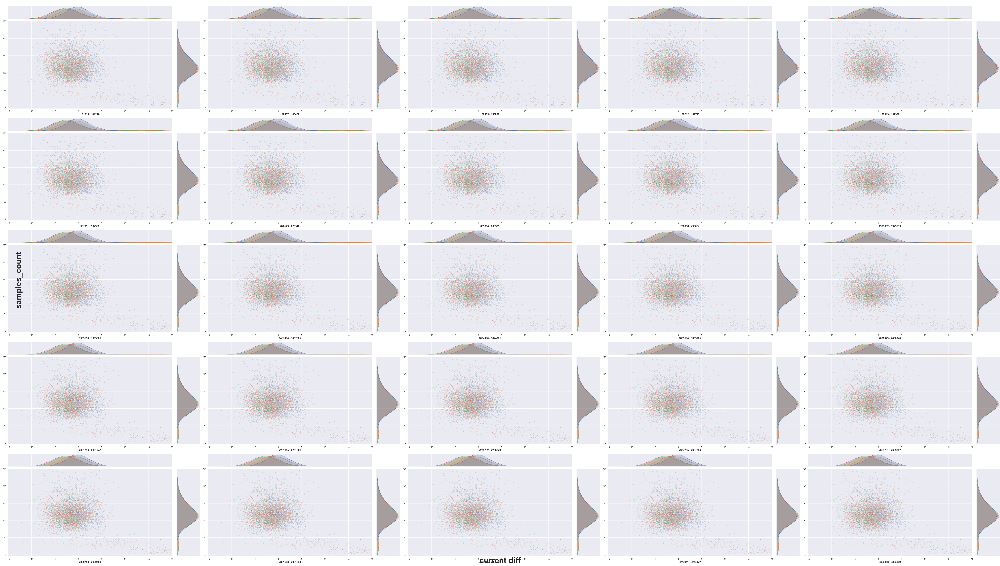

In [556]:
print(loc_files)
i=0
fig = plt.figure(figsize=(71.2,40))
gs = gridspec.GridSpec(5, 5)
for seq_location in loc_files:
    
    mod_loc = int(seq_location.split('_')[0])+1+backwindow

    ### Jonathans window agg suggestion! -8 to +3 known pos to known pos
        # g = hole_window_agg[seq_location][bc]['samples_count'].value_counts().sort_index().loc[lambda count : count>12].plot(kind='bar', stacked=False, width=1, figsize=(15, 10))
        # mean = hole_window_agg[seq_location][bc]['samples_count'].mean()
        # median = hole_window_agg[seq_location][bc]['samples_count'].median()
        # fig2 = g.figure
        # plt.axvline(mean, color='r', linestyle='--')
        # plt.axvline(median, color='g', linestyle='--')
        # plt.xticks(rotation = 90)
        # fig2.suptitle(bc, fontweight='bold', fontsize=13)
        # plt.show()
        # fig2.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_barcode{bc}_samples_count_hist')

    # df = pd.concat([hole_window_agg[seq_location][bc] for bc in full_dict.keys()])
    # fig = plt.figure(figsize=(4,6))
    plot = sns.jointplot(data=df, x='curr diff', y='samples_count', hue='Modification', alpha=0.3, s=5, linewidths=None, legend=False, marginal_kws={'common_norm':False})
    plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
    plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
    plot.ax_joint.set_xlabel(f'{mod_loc - 8} - {mod_loc + 3}', fontweight='bold', fontsize=13)
    plot.ax_joint.set_ylabel(None)
    plot.ax_joint.set_xlim(-15,20)
    plot.ax_joint.set_ylim(-5,250)
    #plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_agg_pos_-{8}_to+{3}.png')
    mgkey = SeabornFig2Grid(plot, fig, gs[i])
    i+=1
    #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
    #plot.tick_params(axis='both', which='major', labelsize=8)
gs.tight_layout(fig)
fig.text(0.5, 0.00, 'current diff', ha='center', va='center', fontweight='bold', fontsize=40)
fig.text(0.02, 0.5, 'samples_count', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=40)
plt.savefig(f'{run_id_path}/events & NNN plots/agg_pos_-{back}_to+{front}_normC_curr_sampels_count_by_kmer.png')

In [ ]:
i=0
# slices = [25]#[i for i in range(6,50) if i%5 ==0]
# for slice_num in slices:
fig = plt.figure(figsize=(71.2,40))
# gs = gridspec.GridSpec(5, 5)
columns = ['?', 'Read', 'samples', 'samples_count', 'Modification']
liniar_plot_df = pd.DataFrame(['Read', 'Modification', 'sample_time', 'raw_current'])
#df.columns = ['?', 'Read', 'samples', 'samples_count', 'curr diff', 'd_time diff', 'Modification']
max_slice = 150
slices = [i for i in range(90,max_slice) if i%1 ==0]
for slice_num in slices:
    print(f'{slice_num} calc')
    
    df_list=[]
    seq = '1329591_1329619'
    for bc in ['09','10','11','12']:
        old_df = pd.read_pickle(f'{run_id_path}/hole_window_agg_{seq}_bc_{bc}_eventalign.pkl')
        old_df = old_df[(old_df['samples_count']) == slice_num]
        temp_df = old_df.drop(columns=['curr diff', 'd_time diff'])
        df_list.append(temp_df)

    for seq_location in loc_files:

        mod_loc = int(seq_location.split('_')[0])+backwindow


        try:
            for bc in ['13']:# full_dict.keys():
                #if bc != '09':
                temp_df = pd.read_pickle(f'{run_id_path}/hole_window_agg_{seq_location}_bc_{bc}_eventalign.pkl')
                temp_df# = temp_df[(temp_df['samples_count']) > 100 & (temp_df['samples_count']<118)]
                temp_df = temp_df[(temp_df['samples_count']) == slice_num]
                df_list.append(temp_df)
        except e:
            print(f"An exception occurred on {seq_location} df_list {e}")
            continue

    df = pd.concat(df_list)

        # value_counts = df['samples_count'].value_counts().sort_index()
        # sample_count_max = value_counts.sort_values().idxmax()
        # df = df[df['samples_count'] == sample_count_max]
        # d.update({mod_loc: sample_count_max})

    df.columns = columns
    try:
        #df[for i in list(range(slice_num))] = pd.DataFrame(df.samples.tolist(), index= df.index)
        for index, row in df.iterrows():
            for i in list(range(slice_num)):
                sampls_df_tmp = pd.DataFrame([[index, row['Modification'], i, row['samples'][i]]], columns = ['Read', 'Modification', 'sample_time', 'raw_current'])
                liniar_plot_df = pd.concat([liniar_plot_df, sampls_df_tmp], ignore_index=True)
        fig = plt.figure(figsize=(10,6))

        plot = sns.lineplot(data=liniar_plot_df, x='sample_time', y='raw_current', hue='Modification')
        plot.set_xlim(0,max_slice)
        plot.set_ylim(60,110)
        # plot.ax_joint.axvline(x=0, color='k', linewidth=.5)
        # plot.ax_joint.axhline(y=0, color='k', linewidth=.5)
        # plot.set_xlabel(f'{mod_loc - 8} - {mod_loc + 3}', fontweight='bold', fontsize=13)
        # plot.ax_joint.set_ylabel(None)
        # plot.ax_joint.set_xlim(-15,20)
        #plt.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_agg_pos_-{8}_to+{3}.png')
        # mgkey = SeabornFig2Grid(plot, fig, gs[i])
        i+=1
        #plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
        #plot.tick_params(axis='both', which='major', labelsize=8)

        plt.savefig(f'{run_id_path}/events & NNN plots/agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png')
        print('agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png')
        # gs.tight_layout(fig)        
        plt.rcParams["axes.labelsize"] = 25
        fig.text(0.5, 0.95, f'slice_num {slice_num}, cov={len(df)}', ha='center', va='center', fontsize=25)
#         fig.text(0.5, 0.02, 'sample_time', ha='center', va='center', fontweight='bold', fontsize=60)
#         fig.text(0.02, 0.5, 'raw_current', ha='center', va='center', rotation='vertical', fontweight='bold', fontsize=60)
        plt.savefig(f'{run_id_path}/events & NNN plots/1329591_1329619/agg_pos_-{back}_to+{front}_#curr_samples_{slice_num}_lineplot_by_kmer.png')
        plot.legend(fontsize=5)
        print(f'{slice_num} done!')
    except e:
        print(f"An exception occurred on {seq_location} df_list {e}")
        continue


90 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
90 done!
91 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
91 done!
92 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
92 done!
93 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
93 done!
94 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
94 done!
95 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
95 done!
96 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
96 done!
97 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
97 done!
98 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
98 done!
99 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
99 done!
100 calc
a

/tmp/ipykernel_9691/432413638.py:52: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,6))


agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
109 done!
110 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
110 done!
111 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
111 done!
112 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
112 done!
113 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
113 done!
114 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
114 done!
115 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
115 done!
116 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
116 done!
117 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
117 done!
118 calc
agg_{mod_loc}_-{back}_to+{front}_#curr_samples_=_{slice_num}_lineplot_by_kmer.png
118 done!

In [ ]:
plt.savefig(f'{run_id_path}/events & NNN plots/agg_pos_-{back}_to+{front}_#curr_samples_lineplot_by_kmer.png')
# pd.DataFrame(d).plot()
print(d)
print([i/back+front+1 for i in d.values()])
hole_window_agg.keys()

['35012780_35012808', '90093194_90093222', '90093195_90093223', '100841407_100841435', '118194794_118194822', '119451384_119451412', '130111245_130111273', '130111246_130111274', '133001642_133001670', '165261090_165261118', '168447069_168447097', '185710054_185710082', '195060987_195061015', '5061569_5061597', '5061570_5061598', '7665112_7665140', '7665113_7665141', '24937314_24937342', '39428218_39428246', '39773361_39773389', '55794829_55794857', '68897991_68898019', '126637179_126637207', '129858291_129858319', '146044960_146044988', '177102471_177102499', '177102472_177102500', '16399098_16399126', '16399099_16399127', '35902783_35902811', '37150387_37150415', '37150388_37150416', '41898025_41898053', '49302722_49302750', '55551524_55551552', '63376359_63376387', '70077099_70077127', '88561663_88561691', '116766911_116766939', '116766912_116766940', '131071503_131071531', '153363833_153363861', '153363834_153363862', '158639053_158639081', '158639054_158639082', '5248731_5248759',

/tmp/ipykernel_23280/3392874642.py:75: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  gs.tight_layout(fig)


<Figure size 7120x4000 with 0 Axes>

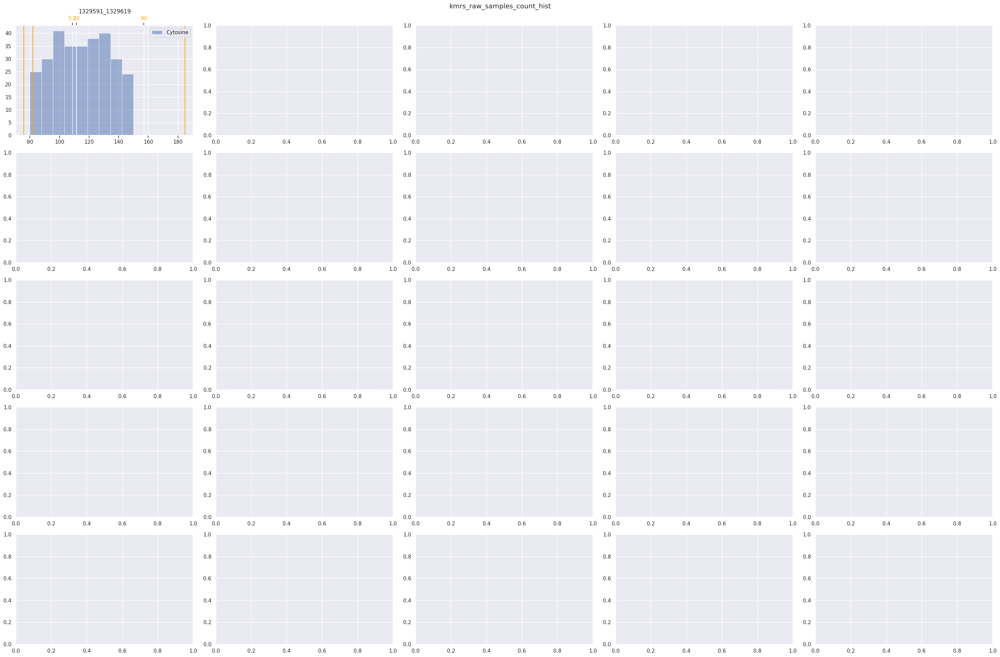

In [77]:
from scipy import stats
from scipy.stats import exponpow
import pandas as pd
import numpy
lable = ["Cytosine", "5hmC", "5gmc", "5gmc-N3"]
print(loc_files)
i=0
hole_window_agg = {}
fig = plt.figure(figsize=(71.2,40))
gs = gridspec.GridSpec(5, 5)
fig, axs = plt.subplots(5, 5, figsize=(30, 20))

quartiles = [5.2,10,90]

for seq_location in ['1329591_1329619']:
    mod_loc = int(seq_location.split('_')[0])+1+backwindow
    hole_window_agg[seq_location] = {}
    
    bins = numpy.linspace(80, 150, 10)
    hist_arr = []
    k = i%5
    j = i//5
    print(f'[{j},{k}]')
    for bc in ['13']:
#         hole_window_agg[seq_location][bc] = pd.read_pickle(f'{run_id_path}/hole_window_agg_{seq_location}_bc_{bc}_eventalign.pkl')

#         a = hole_window_agg[seq_location][bc]['samples_count'].value_counts().sort_index()#.loc[lambda count : count>12]
#         g = a.plot(kind='bar', stacked=False, width=1, figsize=(15, 10))
#         g.set_xlim(0, 240) 
#         g.set_ylim(0, 350) 
#         mean = hole_window_agg[seq_location][bc]['samples_count'].mean()
#         median = hole_window_agg[seq_location][bc]['samples_count'].median()
#         fig = g.figure
#         plt.axvline(mean, color='r', linestyle='--')
#         plt.axvline(median, color='g', linestyle='--')

        #print(hole_window_agg[seq_location][bc]['samples_count'])#.value_counts().sort_index().loc[lambda count : count>12])
        curr_bc_hist = df['samples_count']
        print(curr_bc_hist)
        if bc=='13':
            curr_bc_10 = curr_bc_hist
        hist_arr.append(curr_bc_hist)
        
    percentile = np.percentile(curr_bc_10, quartiles)
    print(quartiles)
    print(percentile)
    for q in percentile:
        axs[j,k].axvline(q, color=full_dict['10']['color'])
    ax2 = axs[j,k].twiny()
    ax2.set_xlim(-10,260)

    # the percentiles as tick positions
    ax2.set_xticks(percentile)
    ax2.set_xticklabels(quartiles, color=full_dict['10']['color'])

    axs[j,k].hist(hist_arr, bins, alpha=0.5, label=lable, histtype='bar', stacked=False)

    axs[j,k].legend(loc='upper right')
    axs[j,k].set_title(f'{seq_location}')  
    
#         plt.xticks(rotation = 90)
#         fig.suptitle(bc, fontweight='bold', fontsize=13)
#         plt.show()
#         fig.savefig(f'{run_id_path}/events & NNN plots/{seq_location}_barcode{bc}_samples_count_hist')
        
    #mgkey = SeabornFig2Grid(plt, fig, gs[i])


    i+=1
#plot.ax_joint.set_title(i-7, fontweight='bold', fontsize=13)
#plot.tick_params(axis='both', which='major', labelsize=8)
fig.suptitle("kmrs_raw_samples_count_hist")
fig.tight_layout()
fig.savefig(f'{run_id_path}/events & NNN plots/kmrs_raw_samples_count_hist')
gs.tight_layout(fig)

In [107]:
[i for i in range(24,101) if i%25 ==0]

[25, 50, 75, 100]